## Import required libs

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline


In [2]:
import numpy as np
import cv2
import glob

class Transform():
    def __init__(self):
        # undistortion
        self.undistortMapX = None
        self.undistortMapY = None
        
        self.perspectiveSrcPoints = []
        self.perspectiveDestPoints = []
        
        self.perspectiveMatrix = None
        self.perspectiveMatrixInv = None
    
        # Store chessboard image file names used for
        # calibration and corners found.
        self.chessboard_imgs_and_corners = []
        
        # termination criteria for "cornerSubPix": max iteratons = 30, epsilon = 0.001
        self._corner_sub_pix_criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
        
        
    def calibrate_with_chessboards(self, glob_pattern, nx, ny, save_corners=False):
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((nx*ny,3), np.float32)
        objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
        
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d point in real world space
        imgpoints = [] # 2d points in image plane.
        
        # Get image file paths matching "glob_pattern"
        images = glob.glob(glob_pattern)
        
        # save shape of first image found
        img_shape = None
        
        # loop over images and find chessboard corners
        for fname in images:
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
            # Find the chess board corners
            ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
            
            # If found, add object points, image points (after refining them)
            if ret == True:
                objpoints.append(objp)
                
                corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),self._corner_sub_pix_criteria)
                imgpoints.append(corners2)
                
                if img_shape is None:
                    img_shape = (img.shape[1], img.shape[0])
                
                if save_corners:
                    self.chessboard_imgs_and_corners.append((fname, corners2))
        
        # calibrate camera using data found processing chessboard images
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape, None, None)
        
        # Get the undistort maps to return.
        self.undistortMapX, self.undistortMapY = cv2.initUndistortRectifyMap(mtx,dist,None,None,img_shape,5)
    
    def init_perspective_transform(self, src_points, dest_points):
        self.perspectiveSrcPoints = src_points
        self.perspectiveDestPoints = dest_points
        self.perspectiveMatrix = cv2.getPerspectiveTransform(self.perspectiveSrcPoints, self.perspectiveDestPoints)
        self.perspectiveMatrixInv = np.linalg.inv(self.perspectiveMatrix)
    
    def remove_distortion(self, image):
        if self.undistortMapX is not None:
            return cv2.remap(image, self.undistortMapX, self.undistortMapY, cv2.INTER_LINEAR)
        else:
            return image
    
    def warp_perspective(self, image):
        return cv2.warpPerspective(image, self.perspectiveMatrix, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    
    def unwarp_perspective(self, image):
        return cv2.warpPerspective(image, self.perspectiveMatrixInv, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)


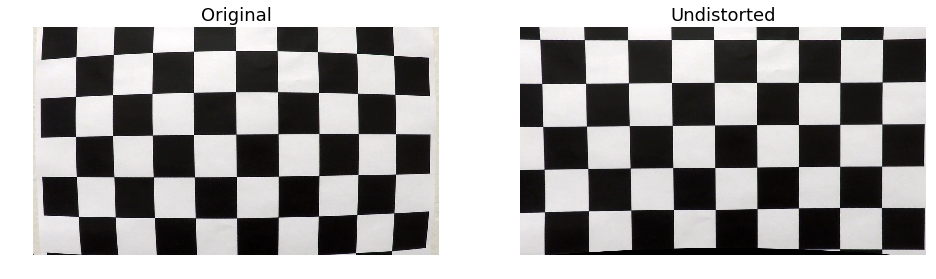

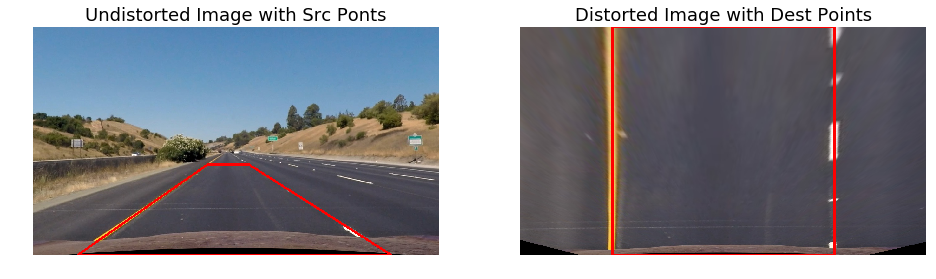

In [3]:
transform = Transform()

transform.calibrate_with_chessboards('camera_cal\calibration*.jpg', 9, 6, True)

#src_points  = np.float32([(345.0,577.0),(520.0,457.0),(718.0, 457.0), (903.0,577.0)])
#dest_points = np.float32([(345.0,577.0),(345.0,325.0),(903.0,325.0),(903.0,577.0)])

src_points  =[(140, 720), (550, 435), (680, 435), (1130, 720)]
dest_points = [(290, 720), (290, 0), (990, 0), (990, 720)]


transform.init_perspective_transform(np.float32(src_points), np.float32(dest_points))

#for chessboard_img_and_corners in transform.chessboard_imgs_and_corners:
#    img = cv2.imread(chessboard_img_and_corners[0])
#    img2 = np.copy(img)
#    cv2.drawChessboardCorners(img2, (9, 6), chessboard_img_and_corners[1], True)
#    
#    # Draw and display the corners
#    fig, axes = plt.subplots(ncols=2, figsize=(16, 9))
#    
#    axes[0].imshow(img2)
#    axes[0].axis('off')
#    
#    img_undist = transform.remove_distortion(img)
#    axes[1].imshow(img_undist)
#    axes[1].axis('off')
#    
#    fig.text(0.125, 0.31, chessboard_img_and_corners[0])


image = mpimg.imread(r"camera_cal/calibration1.jpg")
img_undist = transform.remove_distortion(image)

fig, axes = plt.subplots(ncols=2, figsize=(16, 9))
    
axes[0].imshow(image)
axes[0].axis('off')
axes[0].set_title('Original', fontsize=18)

axes[1].imshow(img_undist)
axes[1].axis('off')
axes[1].set_title('Undistorted', fontsize=18)


image = mpimg.imread(r"output_images/straight_lines1_undist.jpg")
img_warped = transform.warp_perspective(image)

cv2.line(image, src_points[0], src_points[1], (255, 0, 0), thickness=5)
cv2.line(image, src_points[1], src_points[2], (255, 0, 0), thickness=5)
cv2.line(image, src_points[2], src_points[3], (255, 0, 0), thickness=5)
cv2.line(image, src_points[3], src_points[0], (255, 0, 0), thickness=5)

cv2.line(img_warped, dest_points[0], dest_points[1], (255, 0, 0), thickness=7)
cv2.line(img_warped, dest_points[1], dest_points[2], (255, 0, 0), thickness=7)
cv2.line(img_warped, dest_points[2], dest_points[3], (255, 0, 0), thickness=7)
cv2.line(img_warped, dest_points[3], dest_points[0], (255, 0, 0), thickness=7)


fig, axes = plt.subplots(ncols=2, figsize=(16, 9))

axes[0].imshow(image)
axes[0].axis('off')
axes[0].set_title('Undistorted Image with Src Ponts', fontsize=18)

axes[1].imshow(img_warped)
axes[1].axis('off')
axes[1].set_title('Distorted Image with Dest Points', fontsize=18)



In [4]:

def sobel_thresh(gray, sobel_kernel=3, x_thresh=(0, 255), y_thresh=(0,255), mag_thresh=(0, 255), dir_thresh=(0, np.pi/2)):
    sobelx = np.copy(gray)
    sobely = np.copy(gray)
    
    # Calculate gradient magnitude
    sobelx = cv2.Sobel(sobelx, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
    sobely = cv2.Sobel(sobely, cv2.CV_64F, 0, 1, ksize=sobel_kernel) # Take the derivative in y
    
    # x-direction absolute value, scaled, threshold
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    grad_x_binary = np.zeros_like(scaled_sobel)
    grad_x_binary[(scaled_sobel >= x_thresh[0]) & (scaled_sobel <= x_thresh[1])] = 1
    
    # y-direction absolute value, scaled, threshold
    abs_sobely = np.absolute(sobely) # Absolute y derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
    grad_y_binary = np.zeros_like(scaled_sobel)
    grad_y_binary[(scaled_sobel >= y_thresh[0]) & (scaled_sobel <= y_thresh[1])] = 1
    
    # magnitude, scaled, threshold
    sobel_mag = np.sqrt(sobelx ** 2 + sobely ** 2)
    scaled_sobel = np.uint8(255*sobel_mag/np.max(sobel_mag))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # gradient direction absolute value, scaled, threshold
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    
    return grad_x_binary, grad_y_binary, mag_binary, dir_binary


def color_channel_thresh(color_channel, thresh=(0, 255)):
    binary = np.zeros_like(color_channel)
    binary[(color_channel >= thresh[0]) & (color_channel <= thresh[1])] = 1
    return binary


In [5]:
sobel_kernel_size = 9
sobel_x_thresholds = (50, 200)
sobel_y_thresholds = (0, 190)
sobel_mag_thresholds = (50, 180)
sobel_dir_thresholds = (0.7, 1.3)
color_cannel_thresholds = (170, 250)


def to_binary_mask(image):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Apply each of the thresholding functions
    gradx, grady, mag_binary, dir_binary = \
        sobel_thresh(l_channel, sobel_kernel_size, \
                     sobel_x_thresholds, sobel_y_thresholds, \
                     sobel_mag_thresholds, sobel_dir_thresholds)

    channel_binary = color_channel_thresh(s_channel, color_cannel_thresholds)
    
    binary_mask = np.zeros_like(dir_binary)
    binary_mask[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (channel_binary == 1)] = 1
    
    return binary_mask

In [77]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

class Line():
    def __init__(self):
        
        # was the line detected in the last iteration?
        self.detected = False
        
        self.no_detect_count = 0
        
        # x values of the last n fits of the line
        self.recent_xfitted = []
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        
        #polynomial coefficients for the most recent fit
        self.current_fit = None
        
        self.prev_fits = []
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        
        #x values for detected line pixels
        self.allx = None
        
        #y values for detected line pixels
        self.ally = None

    def has_current_fit(self):
        return self.current_fit is not None
    
    def x(self, y):
        if self.current_fit is None:
            return None
        return self.current_fit[0]*y**2 + self.current_fit[1]*y + self.current_fit[2]

def find_base_centroids(binary_warped):
    # Take a histogram of the bottom third of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//3:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    return leftx_base, rightx_base


# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    

min_curvature = 10000
def calc_curvature(best_fit):
    global min_curvature
    
    # Fit new polynomials to x,y in world space
    # Calculate the new radii of curvature
    curvature = ((1 + (2*best_fit[0]*720*ym_per_pix + best_fit[1])**2)**1.5) / np.absolute(2*best_fit[0])
    # Now our radius of curvature is in meters
    
    #if curvature < min_curvature:
    #    min_curvature = curvature
    #    print("min c: " + str(min_curvature))
    
    return curvature

def are_lanes_reasonable(left_line, right_line):
    ploty = np.linspace(0, 719, 720 )
    left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
    right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]
    
    if left_fitx[719] > 600:
        return False
    if right_fitx[719] < 700:
        return False
    
    diff_fitx = right_fitx - left_fitx
    min_fitx = np.min(diff_fitx)
    if(min_fitx < 500) or (min_fitx > 900):
        return False
    
    max_fitx = np.max(diff_fitx)
    if(max_fitx < 500) or (max_fitx > 900):
        return False
    
    return True

def find_lanes(binary_warped, left_line, right_line):
    
    bw = np.zeros_like(binary_warped, dtype=np.uint8)
    bw[(binary_warped == 1)] = 255
    out_img = np.dstack((bw, bw, bw))
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
   
    fig, axes = plt.subplots(figsize=(16, 9))
    fig.tight_layout()
    axes.imshow(out_img)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Set the width of the windows +/- margin
    margin = 100
        
    # Set minimum number of pixels found to recenter window
    minpix = 50
        
    if (left_line.current_fit is None) or (right_line.current_fit is None):
        # These will be the starting point for the left and right lines
        leftx_base, rightx_base = find_base_centroids(binary_warped)
    
        # Choose the number of sliding windows
        nwindows = 9
        
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        
        # Step through the windows one by one
        for window in range(nwindows):
            
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_y_center = (win_y_high - win_y_low)//2;
            
            win_xleft_center = leftx_current
            win_xright_center = rightx_current
            
            win_xleft_low = win_xleft_center - margin
            win_xleft_high = win_xleft_center + margin
            win_xright_low = win_xright_center - margin
            win_xright_high = win_xright_center + margin
            
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 5) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 5) 
    
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    
    
    if left_line.best_fit is not None:
        left_x_centers = (left_line.best_fit[0]*(nonzeroy**2) + left_line.best_fit[1]*nonzeroy + left_line.best_fit[2])
        left_lane_inds = ((nonzerox >  (left_x_centers - 50)) & (nonzerox < (left_x_centers + 50)))
        
    if right_line.best_fit is not None:
        right_x_centers = (right_line.best_fit[0]*(nonzeroy**2) + right_line.best_fit[1]*nonzeroy + right_line.best_fit[2])
        right_lane_inds = ((nonzerox > (right_x_centers - 50)) & (nonzerox < (right_x_centers + 50)))  
        
    # Extract left and right line pixel positions
    left_line.allx = nonzerox[left_lane_inds]
    left_line.ally = nonzeroy[left_lane_inds] 
    right_line.allx = nonzerox[right_lane_inds]
    right_line.ally = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    if len(left_line.allx) > minpix:
        left_line.detected = True
        new_radius_of_curvature = calc_curvature(np.polyfit(left_line.ally * ym_per_pix, left_line.allx * xm_per_pix, 2))
        if(new_radius_of_curvature < 50):
            left_line.detected = False
            left_line.no_detect_count += 1
            if left_line.no_detect_count >= 5:
                left_line.no_detect_count = 0
                left_line.prev_fits = []
                left_line.best_fit = None
        else:
            left_line.no_detect_count = 0
            left_line.current_fit = np.polyfit(left_line.ally, left_line.allx, 2)
            
        
    else:
        left_line.detected = False
        left_line.no_detect_count += 1
        if left_line.no_detect_count >= 5:
            left_line.no_detect_count = 0
            left_line.prev_fits = []
            left_line.best_fit = None
        
    if len(right_line.allx) > minpix:
        right_line.detected = True
        new_radius_of_curvature = calc_curvature(np.polyfit(right_line.ally * ym_per_pix, right_line.allx * xm_per_pix, 2))
        if(new_radius_of_curvature < 50):
            right_line.detected = False
            right_line.no_detect_count += 1
            if right_line.no_detect_count >= 5:
                right_line.no_detect_count = 0
                right_line.prev_fits = []
                right_line.best_fit = None
        else:
            right_line.no_detect_count = 0
            right_line.current_fit = np.polyfit(right_line.ally, right_line.allx, 2)
            
        
        #right_line.detected = True
        #right_line.no_detect_count = 0
        #right_line.current_fit = np.polyfit(right_line.ally, right_line.allx, 2)
        #right_line.radius_of_curvature = calc_curvature(np.polyfit(right_line.ally * ym_per_pix, right_line.allx * xm_per_pix, 2))
        #if len(right_line.prev_fits) >= 5:
        #    right_line.prev_fits = right_line.prev_fits[1:]
        #right_line.prev_fits.append(right_line.current_fit)
        #right_line.best_fit = np.mean(right_line.prev_fits, axis=0)
        
        
    else:
        right_line.detected = False
        right_line.no_detect_count += 1
        if right_line.no_detect_count >= 5:
            right_line.no_detect_count = 0
            right_line.prev_fits = []
            right_line.best_fit = None
    
    fig, axes = plt.subplots(figsize=(16, 9))
    fig.tight_layout()
    axes.imshow(out_img)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

    if (left_line.detected) and (right_line.detected):
        if not are_lanes_reasonable(left_line, right_line):
            left_line.detected = False
            left_line.no_detect_count += 1
            if left_line.no_detect_count >= 5:
                left_line.no_detect_count = 0
                left_line.prev_fits = []
                left_line.best_fit = None
            
            right_line.detected = False
            right_line.no_detect_count += 1
            if right_line.no_detect_count >= 5:
                right_line.no_detect_count = 0
                right_line.prev_fits = []
                right_line.best_fit = None
        else:
            if len(left_line.prev_fits) >= 5:
                left_line.prev_fits = left_line.prev_fits[1:]
            left_line.prev_fits.append(left_line.current_fit)
            left_line.best_fit = np.mean(left_line.prev_fits, axis=0)
            
            if len(right_line.prev_fits) >= 5:
                right_line.prev_fits = right_line.prev_fits[1:]
            right_line.prev_fits.append(right_line.current_fit)
            right_line.best_fit = np.mean(right_line.prev_fits, axis=0)
     
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_mask.shape[0]-1, warped_binary_mask.shape[0] )
    left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
    right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]

    bw = np.zeros_like(warped_binary_mask, dtype=np.uint8)
    bw[(warped_binary_mask == 1)] = 255
    out_img = np.dstack((bw, bw, bw))

    window_img = np.zeros_like(out_img)
    
    # Identify the x and y positions of all nonzero pixels in the image
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    fig, axes = plt.subplots(figsize=(16, 9))
    axes.imshow(result)
    
    axes.plot(left_fitx, ploty, color='yellow')
    axes.plot(left_fitx + 1, ploty, color='yellow')
    axes.plot(left_fitx - 1, ploty, color='yellow')
    axes.plot(right_fitx, ploty, color='yellow')
    axes.plot(right_fitx + 1, ploty, color='yellow')
    axes.plot(right_fitx - 1, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)


    return left_line, right_line


In [7]:
def fill_lane(image, warped_binary_mask, left_fitxz, right_fitxz, plotyz):
    warp_zero = np.zeros_like(warped_binary_mask).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitxz, plotyz]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitxz, plotyz])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarped_image = transform.unwarp_perspective(color_warp)
    # Combine the result with the original image
    return cv2.addWeighted(image, 1, unwarped_image, 0.3, 0)

def fill_lane_keep_warp(image, warped_binary_mask, left_fitxz, right_fitxz, plotyz):
    warp_zero = np.zeros_like(warped_binary_mask).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitxz, plotyz]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitxz, plotyz])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Combine the result with the original image
    return cv2.addWeighted(image, 1, color_warp, 0.3, 0)

In [8]:


def get_lane_finder():
    left_line = Line()
    right_line = Line()
    
    def process_image(ixmgblarg):
        img_undistort = transform.remove_distortion(ixmgblarg)
        #img_warp = transform.warp_perspective(img_undistort)
        #warped_binary_mask = to_binary_mask(img_warp)

        binary_mask = to_binary_mask(img_undistort)
        warped_binary_mask = transform.warp_perspective(binary_mask)
        
        find_lanes(warped_binary_mask, left_line, right_line)
        
        if (left_line.best_fit is not None) and (right_line.best_fit is not None):
            ploty = np.linspace(0, warped_binary_mask.shape[0]-1, warped_binary_mask.shape[0] )
            left_fitx = left_line.best_fit[0]*ploty**2 + left_line.best_fit[1]*ploty + left_line.best_fit[2]
            right_fitx = right_line.best_fit[0]*ploty**2 + right_line.best_fit[1]*ploty + right_line.best_fit[2]
        
            final_img = fill_lane(img_undistort, warped_binary_mask, left_fitx, right_fitx, ploty)
        else:
            final_img = img_undistort
        
        return final_img
    
    return process_image


1.0
255
1.0
255
1.0
255
1.0
255
1.0
255
1.0
255
1.0
255
1.0
255
1.0
255


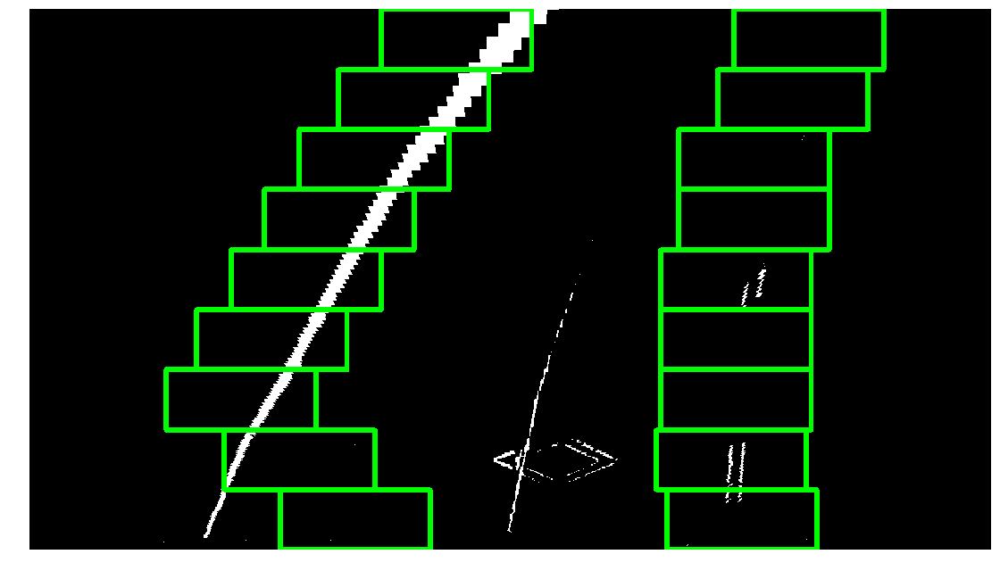

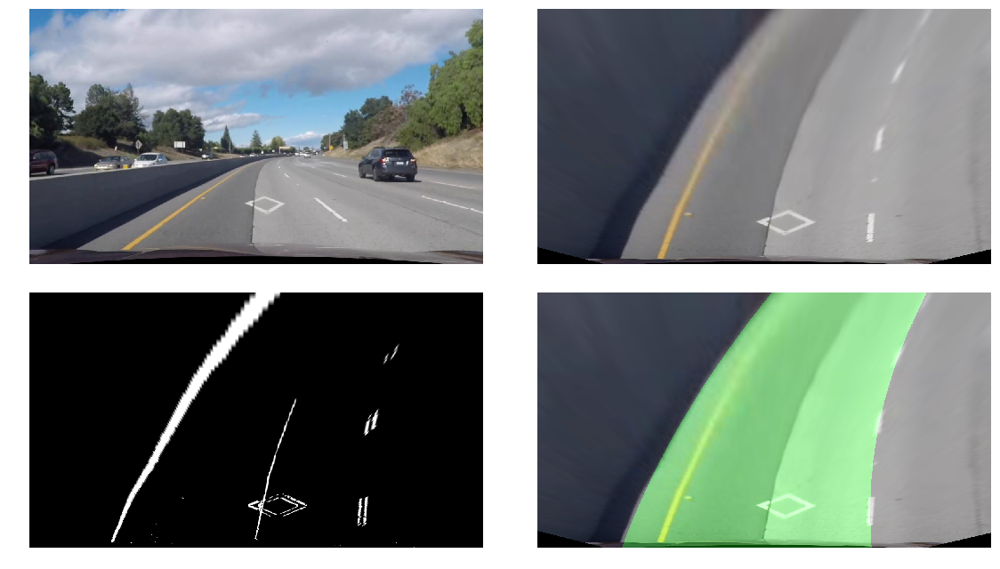

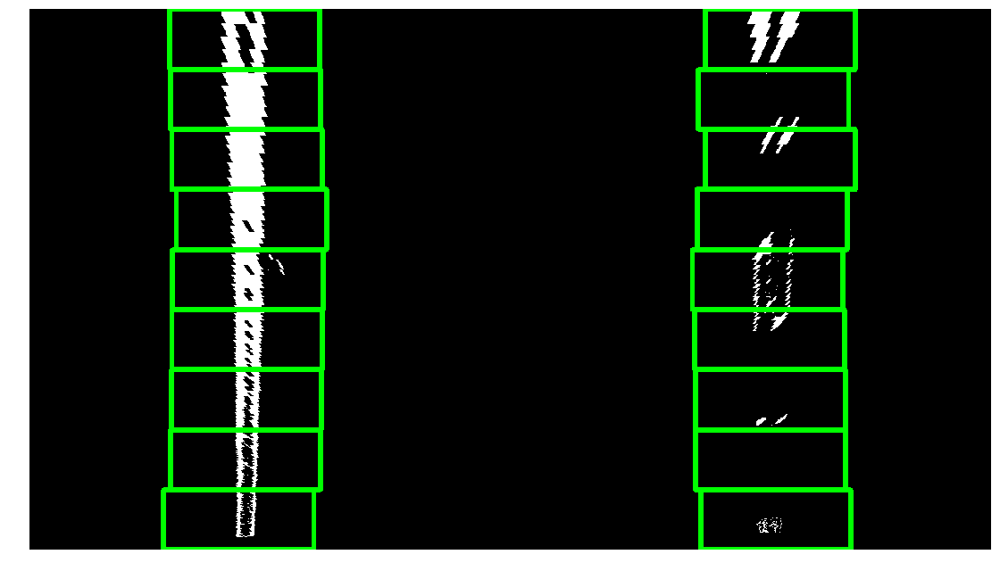

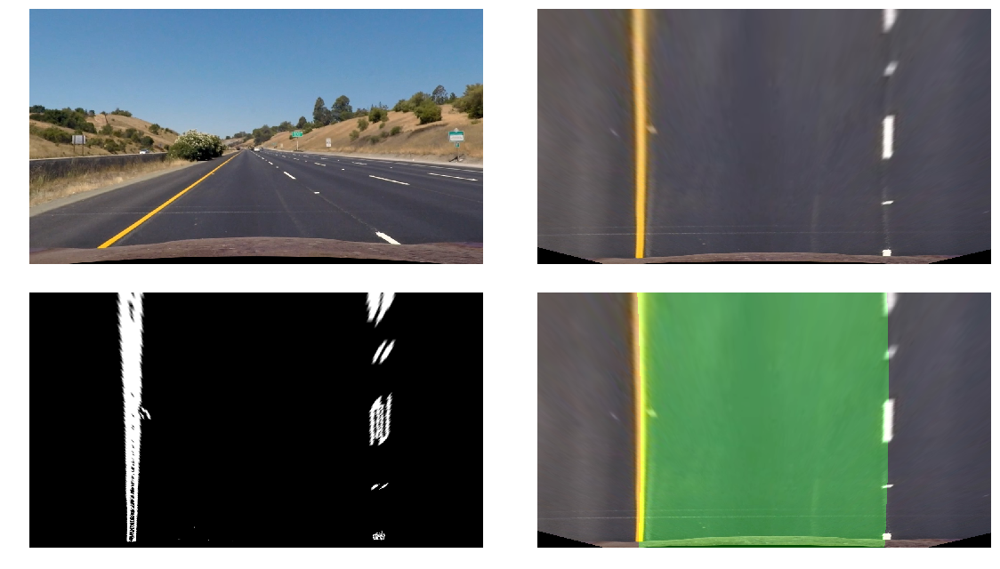

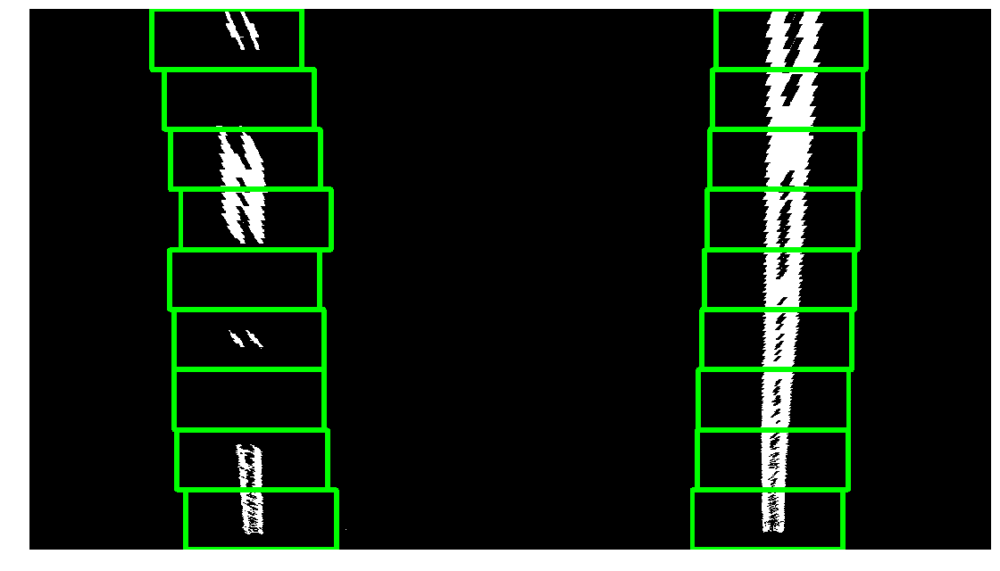

...

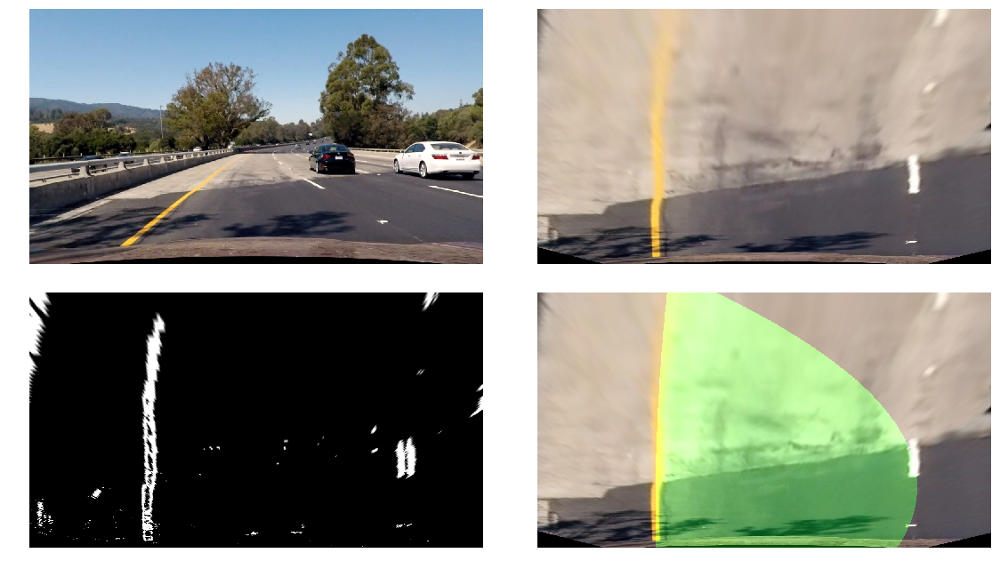

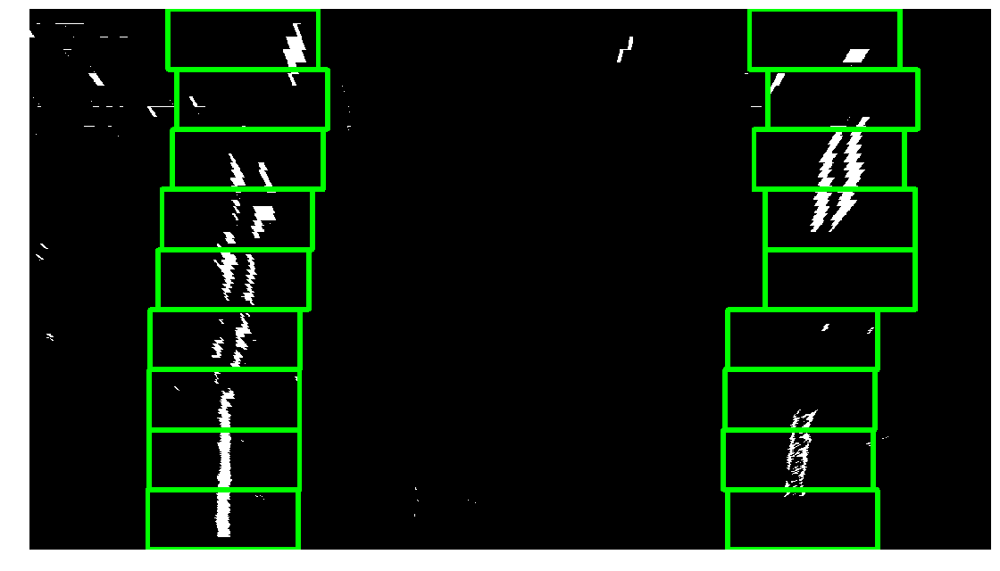

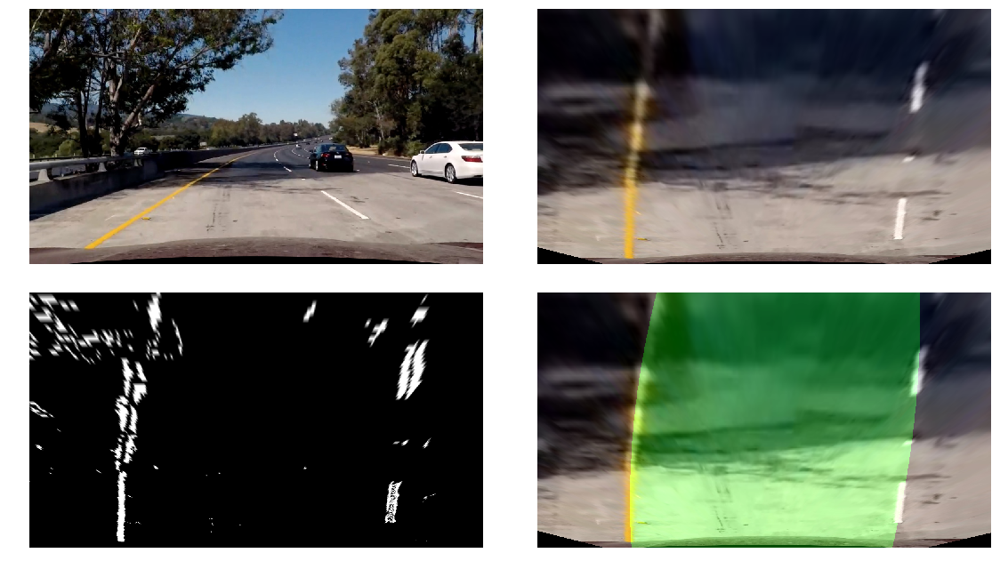

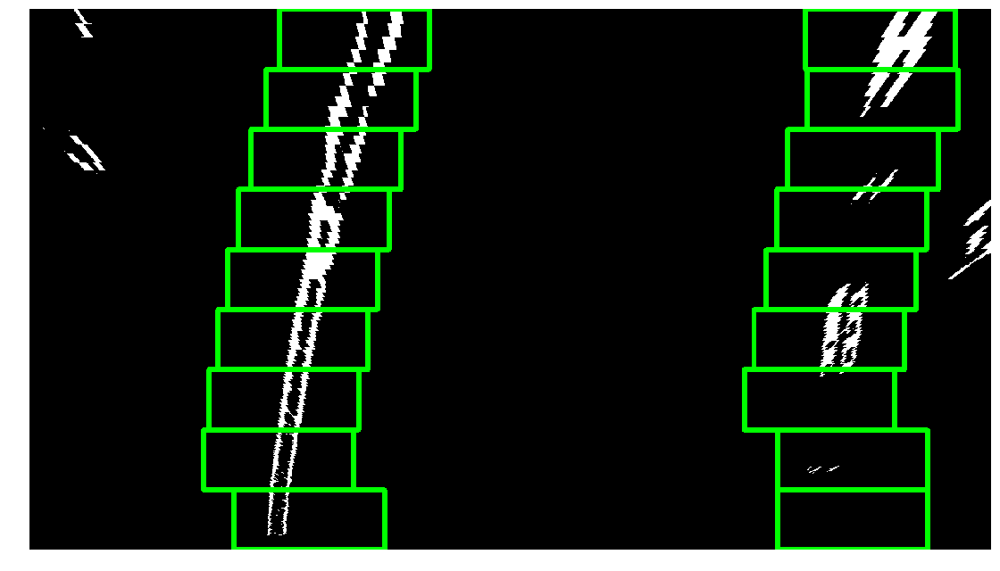

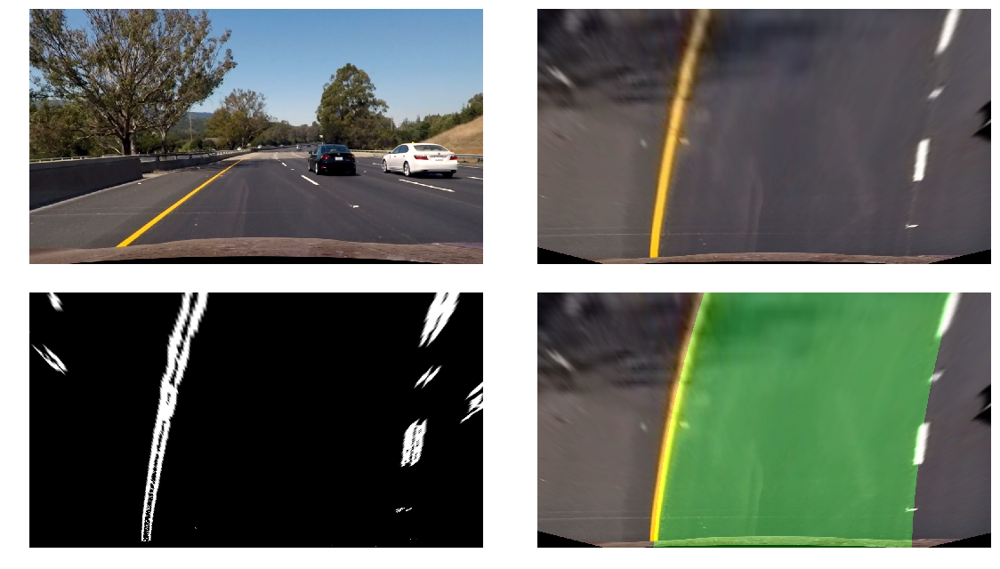

In [43]:
def equalizeIntensity(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(5,5))
    imgHsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    imgHsv[:,:,2] = clahe.apply(imgHsv[:,:,2])
    image = cv2.cvtColor(imgHsv, cv2.COLOR_HSV2RGB)
    
    return image;

images = glob.glob(r"test_images\*.jpg")
for idx, fname in enumerate(images):
        
    img = mpimg.imread(fname)
    
    # img = equalizeIntensity(img)
    
    img_undistort = transform.remove_distortion(img)
    
    binary_mask = to_binary_mask(img_undistort)
    
    img_warp = transform.warp_perspective(img_undistort)
    
    warped_binary_mask = transform.warp_perspective(binary_mask)
    
    left_line, right_line = find_lanes(warped_binary_mask, Line(), Line())
    
    binary_mask_rgb = np.dstack(( binary_mask, binary_mask, binary_mask))
    warped_binary_mask_rgb = np.dstack(( warped_binary_mask, warped_binary_mask, warped_binary_mask))
    
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
    fig.tight_layout()
    # Draw and display the corners
    axes[0,0].imshow(img_undistort)
    #axes[0,0].imshow(img)
    axes[0,0].axis('off')
    
    axes[0,1].imshow(img_warp)
    #axes[0,1].imshow(img)
    axes[0,1].axis('off')
    
    axes[1,0].imshow(warped_binary_mask_rgb)
    #axes[1,0].imshow(img)
    axes[1,0].axis('off')
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_mask.shape[0]-1, warped_binary_mask.shape[0] )
    left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
    right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]
    
    out_img = fill_lane_keep_warp(img_warp, warped_binary_mask, left_fitx, right_fitx, ploty)
    #out_img = process_image(img)
    axes[1,1].imshow(out_img)
    axes[1,1].axis('off')


(-0.5, 1279.5, 719.5, -0.5)

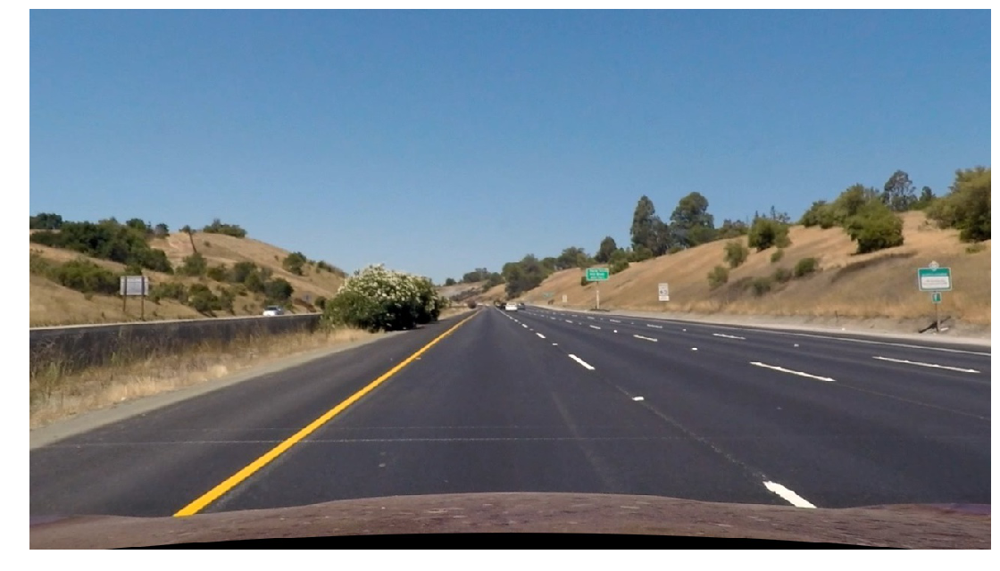

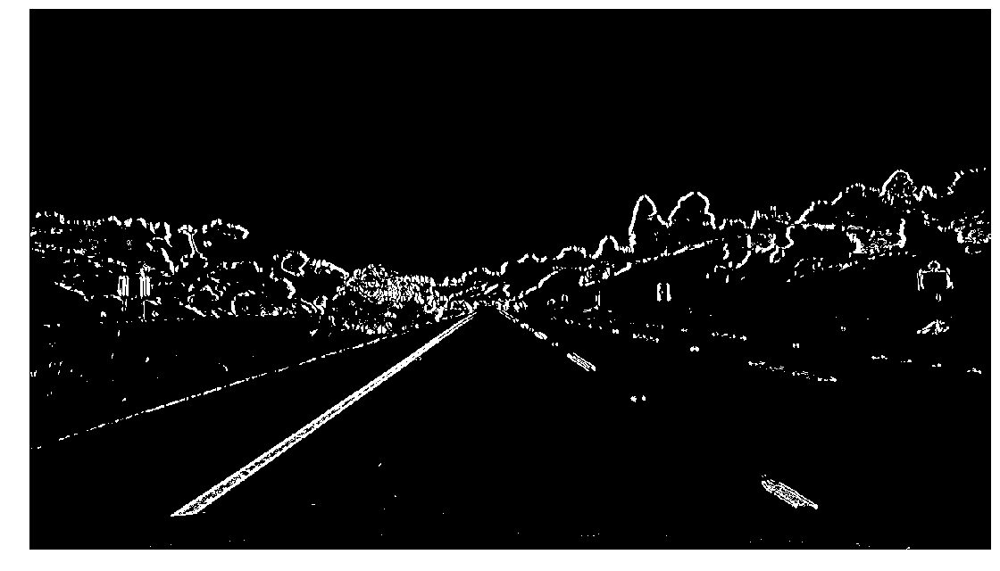

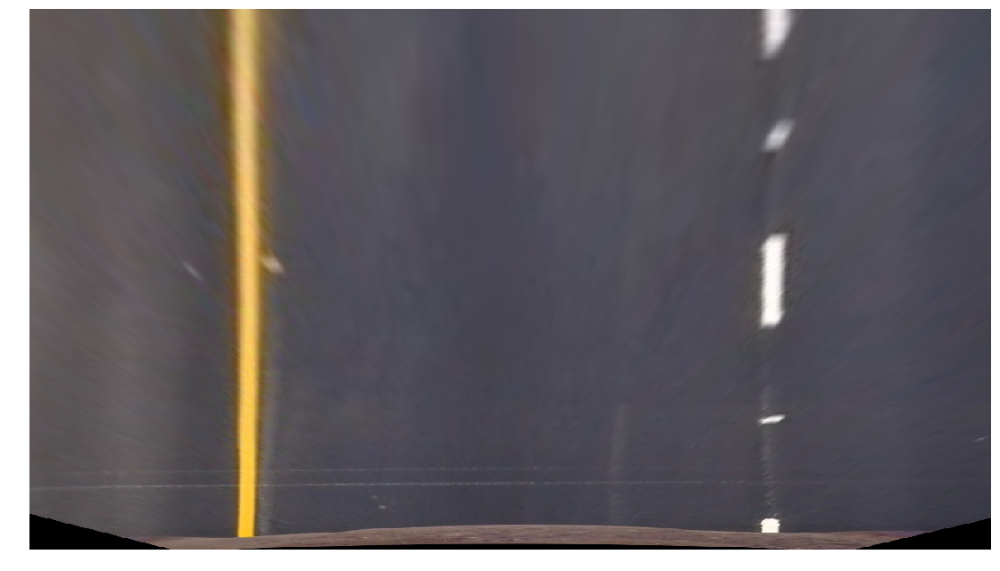

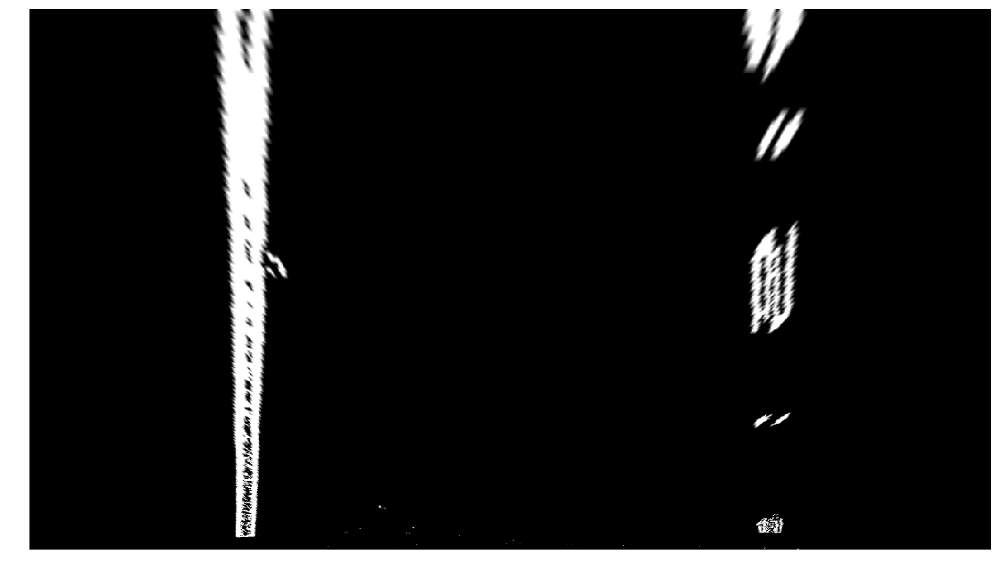

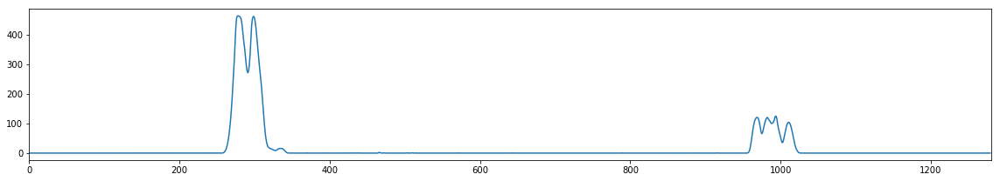

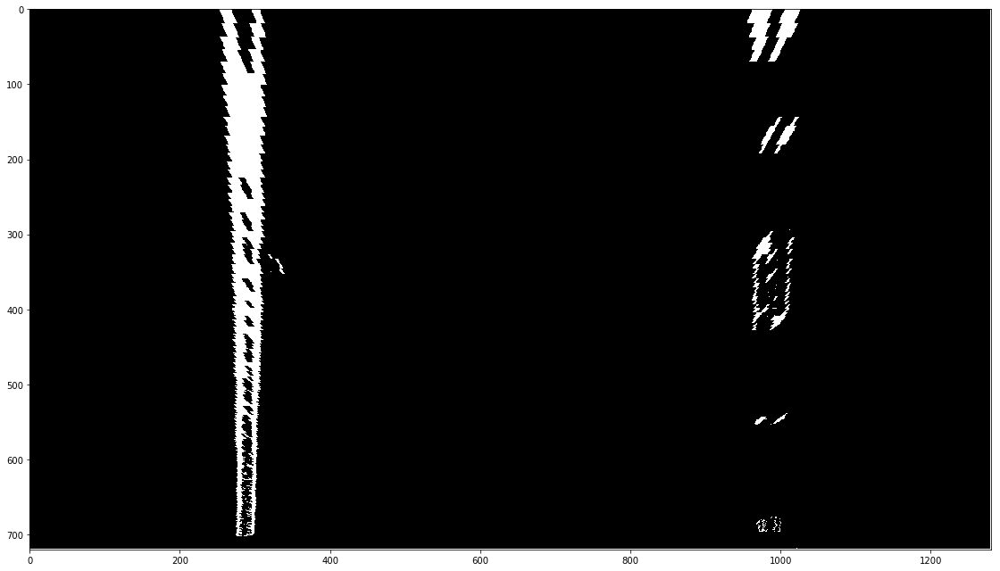

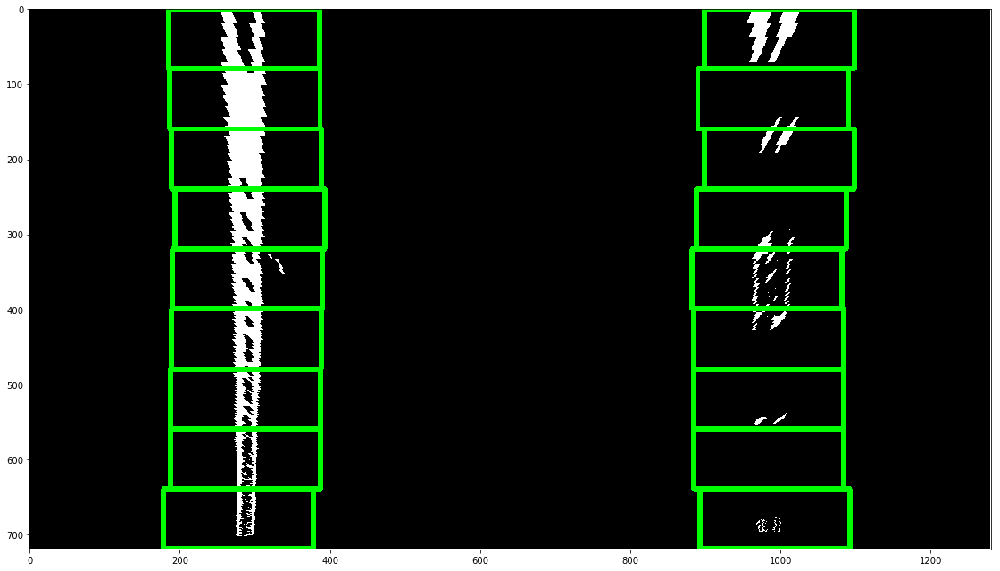

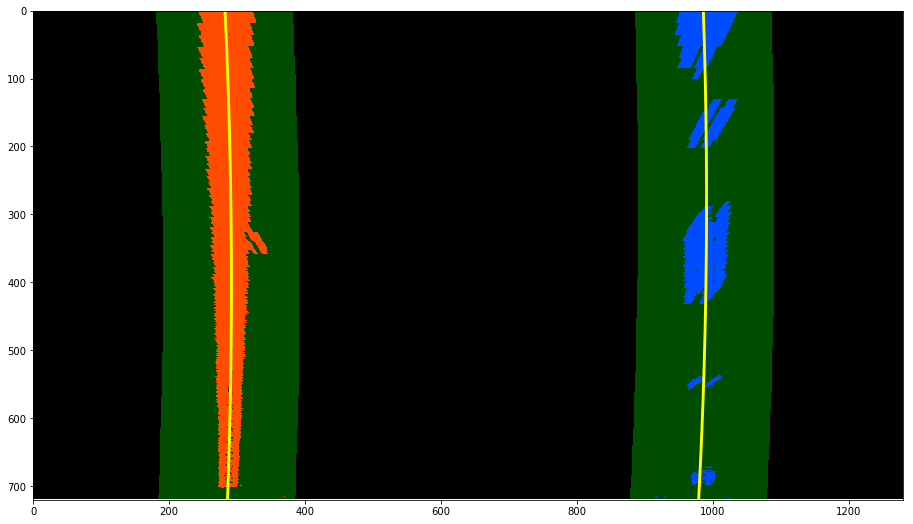

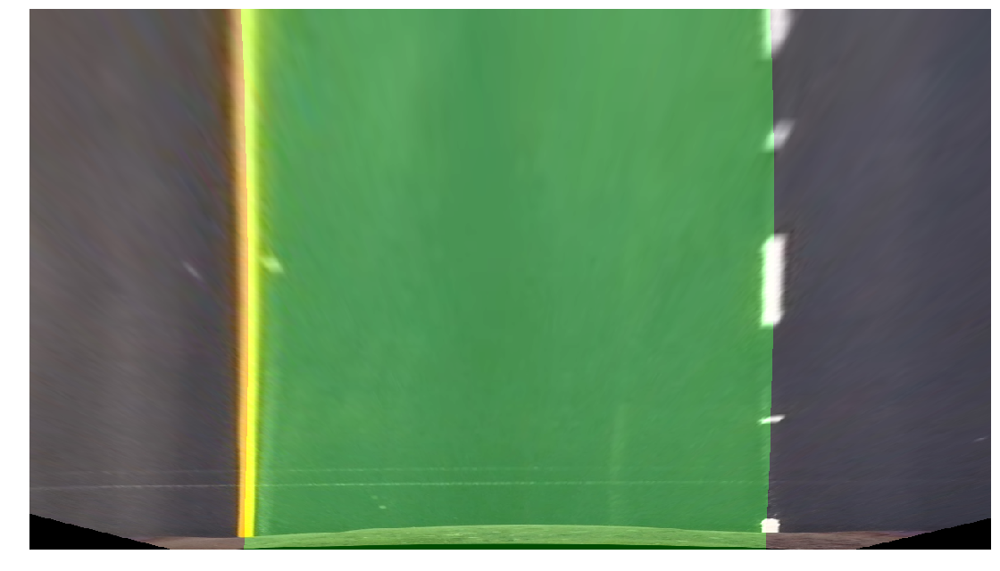

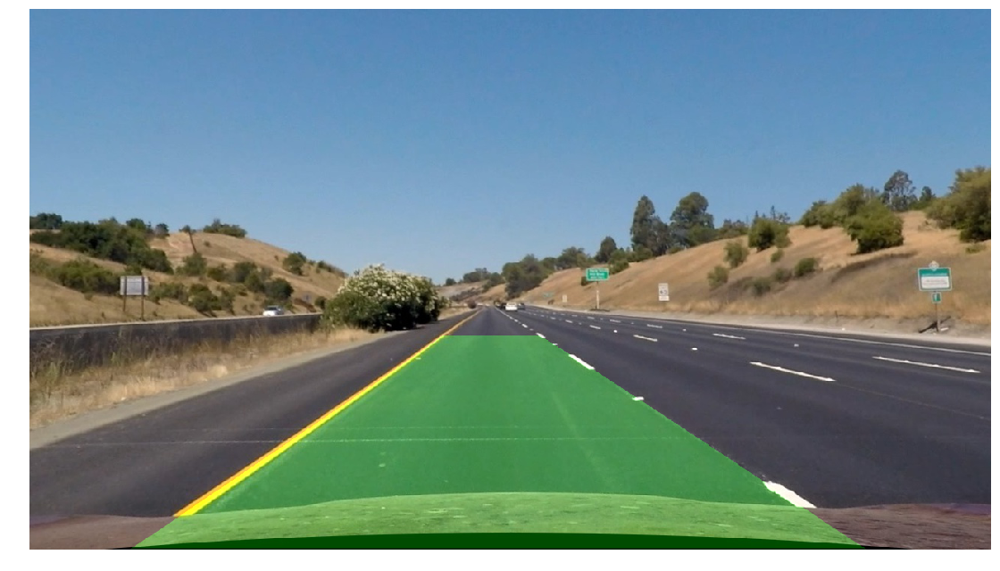

In [78]:
img_undistort = mpimg.imread(r"output_images/straight_lines1_undist.jpg")

fig, axes = plt.subplots(figsize=(16, 9))
fig.tight_layout()
axes.imshow(img_undistort)
axes.axis('off')
    

binary_mask = to_binary_mask(img_undistort)
binary_mask_rgb = np.dstack(( binary_mask, binary_mask, binary_mask))
fig, axes = plt.subplots(figsize=(16, 9))
fig.tight_layout()
axes.imshow(binary_mask_rgb)
axes.axis('off')


img_warp = transform.warp_perspective(img_undistort)
fig, axes = plt.subplots(figsize=(16, 9))
fig.tight_layout()
axes.imshow(img_warp)
axes.axis('off')

warped_binary_mask = transform.warp_perspective(binary_mask)
warped_binary_mask_rgb = np.dstack(( warped_binary_mask, warped_binary_mask, warped_binary_mask))
fig, axes = plt.subplots(figsize=(16, 9))
fig.tight_layout()
axes.imshow(warped_binary_mask_rgb)
axes.axis('off')

histogram = np.sum(warped_binary_mask[warped_binary_mask.shape[0]//3:,:], axis=0)
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

plotx = np.linspace(0, warped_binary_mask.shape[1]-1, warped_binary_mask.shape[1] )

fig, axes = plt.subplots(figsize=(16, 3))
fig.tight_layout()
plt.xlim([0,plotx.size])
axes.plot(plotx, histogram)

left_line, right_line = find_lanes(warped_binary_mask, Line(), Line())

    





out_img = fill_lane_keep_warp(img_warp, warped_binary_mask, left_fitx, right_fitx, ploty)
fig, axes = plt.subplots(figsize=(16, 9))
fig.tight_layout()
axes.imshow(out_img)
axes.axis('off')

out_img = fill_lane(img_undistort, warped_binary_mask, left_fitx, right_fitx, ploty)
fig, axes = plt.subplots(figsize=(16, 9))
fig.tight_layout()
axes.imshow(out_img)
axes.axis('off')


1.0
255
1.0
255


(-0.5, 1279.5, 719.5, -0.5)

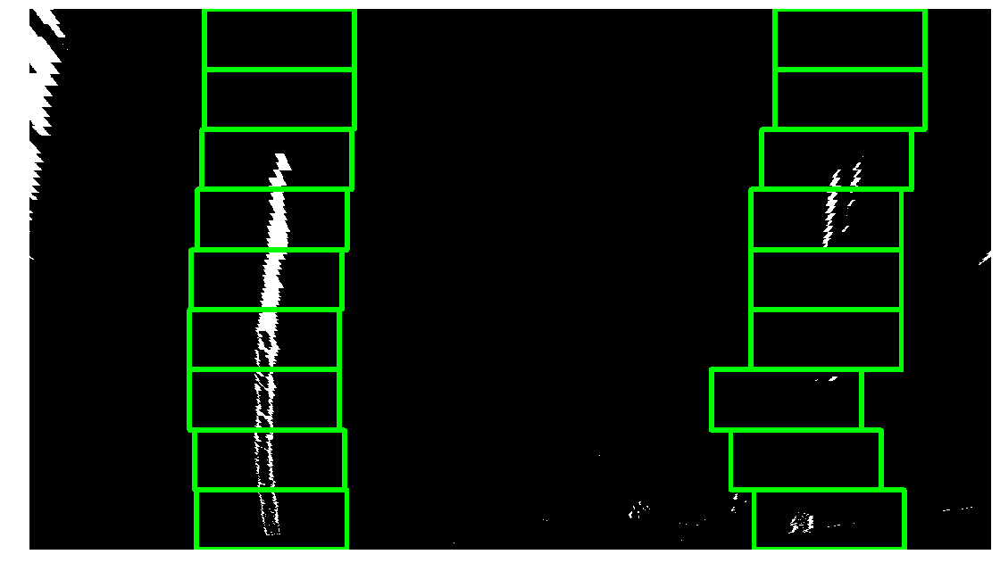

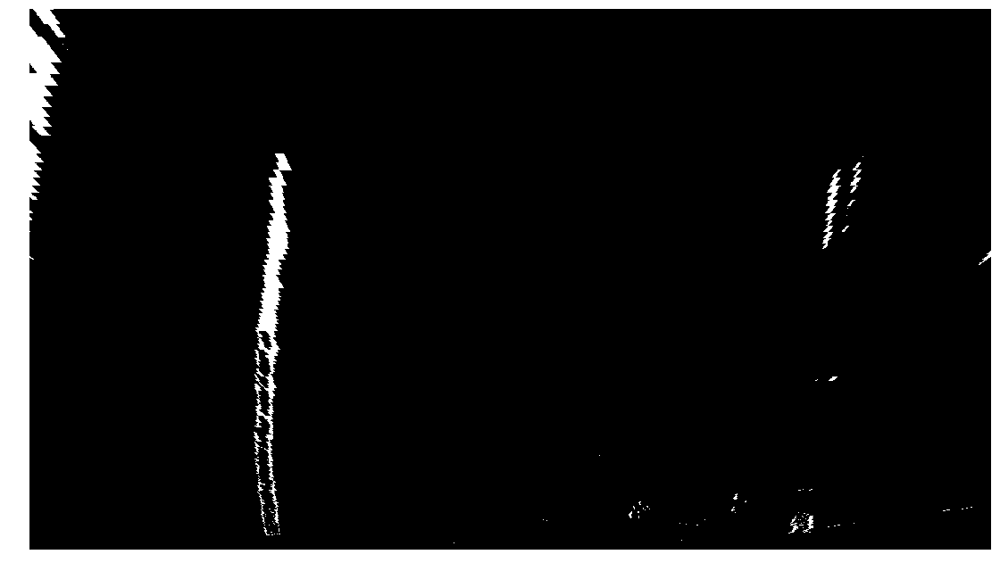

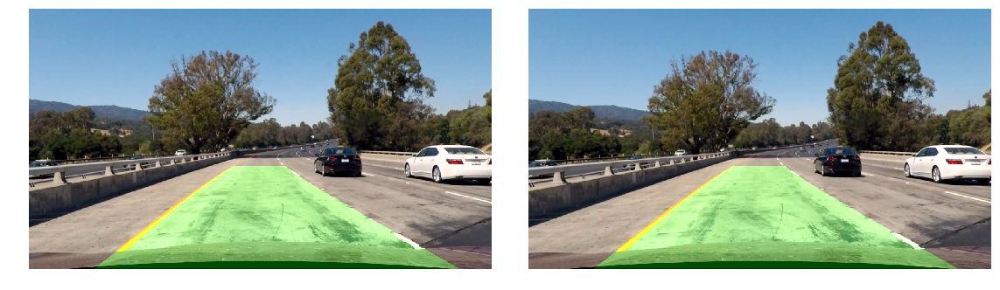

In [42]:
images = glob.glob(r"test_images\*.jpg")
left_line = Line()
right_line = Line()
        
img = mpimg.imread(r"test_images\test1.jpg")
img_undistort = transform.remove_distortion(img)
binary_mask = to_binary_mask(img_undistort)
warped_binary_mask = transform.warp_perspective(binary_mask)
    
find_lanes(warped_binary_mask, left_line, right_line)

ploty = np.linspace(0, warped_binary_mask.shape[0]-1, warped_binary_mask.shape[0] )

left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]
out_img1 = fill_lane(img_undistort, warped_binary_mask, left_fitx, right_fitx, ploty)

img = mpimg.imread(r"test_images\test1.jpg")
img_undistort = transform.remove_distortion(img)
binary_mask = to_binary_mask(img_undistort)
warped_binary_mask = transform.warp_perspective(binary_mask)
    
find_lanes(warped_binary_mask, left_line, right_line)

left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]
out_img2 = fill_lane(img_undistort, warped_binary_mask, left_fitx, right_fitx, ploty)

fig, axes = plt.subplots(ncols=2, figsize=(16, 9))
fig.tight_layout()

# Draw and display the corners
axes[0].imshow(out_img1)
axes[0,].axis('off')

axes[1].imshow(out_img2)
axes[1].axis('off')


In [35]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'project_video_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(get_lane_finder()) #NOTE: this function expects color images!!
video_clip.write_videofile(video_output, audio=False)
clip1.__del__()
video_clip.__del__()


[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:05<00:00,  5.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



In [36]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'harder_challenge_video_out.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
video_clip = clip1.fl_image(get_lane_finder()) #NOTE: this function expects color images!!
video_clip.write_videofile(video_output, audio=False)
clip1.__del__()
video_clip.__del__()


[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [03:01<00:00,  6.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 



In [3]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip1 = VideoFileClip("challenge_video.mp4")
clip1.save_frame("frame0.jpg", t=6.5)
clip1.__del__()

In [21]:
x1 = np.array([5, 10, 15, 20, 25, 30])
x2 = np.array([99, 100, 112, 115, 130, 129])

xdiff = x2 -x1

print(np.min(xdiff))
print(np.max(xdiff))
print(np.mean(xdiff))
print((x1 + x2) / 2)


90
105
96.6666666667
[ 52.   55.   63.5  67.5  77.5  79.5]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2


# window settings
window_width = 100 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 50 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def find_lanes_centroids(binary_warped, window_centroids, window_width, window_height, margin):
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warp_mask_img)
    r_points = np.zeros_like(warp_mask_img)
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (level+1)*window_height
        win_y_high = binary_warped.shape[0] - level*window_height
        win_xleft_low =  max(0,int(window_centroids[level][0]-window_width/2))
        win_xleft_high = min(int(window_centroids[level][0]+window_width/2),binary_warped.shape[1])
        win_xright_low = max(0,int(window_centroids[level][1]-window_width/2))
        win_xright_high = min(int(window_centroids[level][1]+window_width/2),binary_warped.shape[1])
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds
